## Worksheet 2

### This is the second set of exercises for the Open Quantum Systems course. As before, there are both analytical and numerical components to the exercises. Each of the 8 questions below is worth 4 marks. 

---

## 1. 
Hamiltonian dynamics for mixed states (in the Schrödinger picture) is described by the von Neumann equation 

$$\frac{{\rm d}\hat{\rho}}{{\rm d}t} = \frac{1}{{\rm i}\hbar}[\hat{H},\hat{\rho}].$$

Suppose that the Hamiltonian comprises a sum of two terms, $\hat{H} = \hat{H}_0 + \hat{H}_1$. The density matrix in the interaction picture generated by $\hat{H}_0$ is defined by

$$ \hat{\rho}_I(t) = \hat{U}^\dagger_0(t,t_0) \hat{\rho}(t) \hat{U}_0(t,t_0),$$

where $\hat{U}_0(t,t_0) = {\rm e}^{-{\rm i}\hat{H}_0 (t-t_0)/\hbar}$, $\hat{\rho}(t)$ is the density matrix in the Schrödinger picture, and $t_0$ is an (arbitrary) initial time. Show that the state in the interaction picture obeys a differential equation of the form

$$ \frac{{\rm d}\hat{\rho}_I}{{\rm d}t} = \frac{1}{{\rm i}\hbar} [\hat{H}_I(t), \hat{\rho}_I(t)],$$

and give an explicit expression for the interaction-picture Hamiltonian $\hat{H}_I(t)$. What is the general solution of this equation in terms of the initial condition $\hat{\rho}(t_0)$?

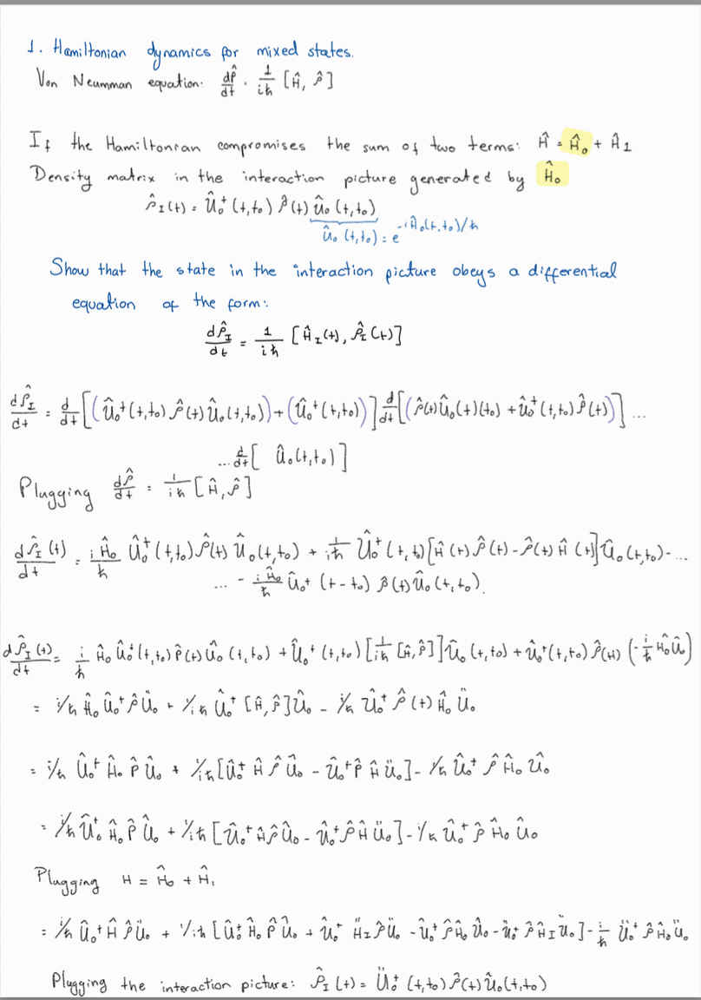

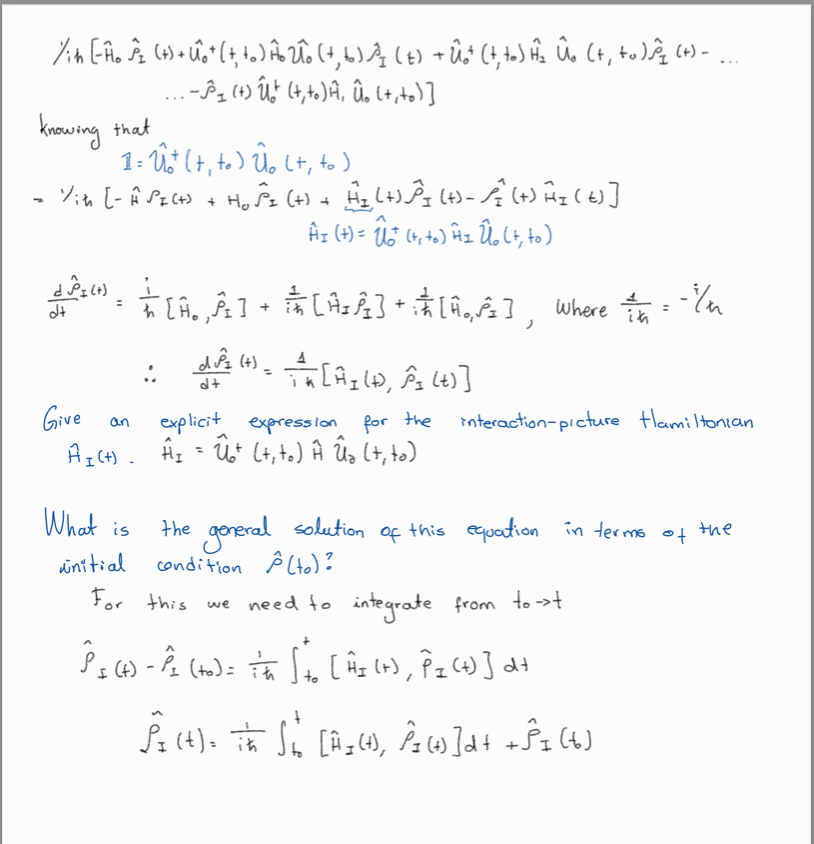

## 2.
A thermal equilibrium state is a mixed state with two key properties: <br>
    (i) it is stationary (unchanging) under Hamiltonian dynamics and <br>
    (ii) the probability $p_i$ of finding the system with energy $E_i$ is given by the Boltzmann distribution of statistical mechanics, i.e. $p_i = {\rm e}^{-\beta E_i}/Z$, where $\beta = 1/k_BT$ is the inverse temperature and $Z = \sum_i {\rm e}^{-\beta E_i}$ is the partition function.<br>

In quantum mechanics, the thermal state of a system whose dynamics are governed by the Hamiltonian $\hat{H}$ is given by

$$\hat{\rho}_\beta = \frac{{\rm e}^{-\beta \hat{H}}}{Z}, $$

where $Z = {\rm tr}[{\rm e}^{-\beta \hat{H}}]$.

(a) Show that this state obeys both properties (i) and (ii).    

(b) For a qubit with Hamiltonian $\hat{H} = \tfrac{1}{2}\hbar\omega \hat{\sigma}_z$, show that

$$ \hat{\rho}_\beta = \frac{1}{2}\left[\hat{\mathbb{1}} - \tanh(\beta\hbar\omega/2) \hat{\sigma}_z\right].$$

(Hint: take a look at Exercise 1(a), Worksheet 1)

(c) Find analytical expressions for the expectation values of the three Pauli matrices in the above thermal equilibrium state. Plot the thermal expectation value of $\langle \hat{\sigma}_z\rangle$ as a function of dimensionless temperature, $k_B T/\hbar\omega$.

(a)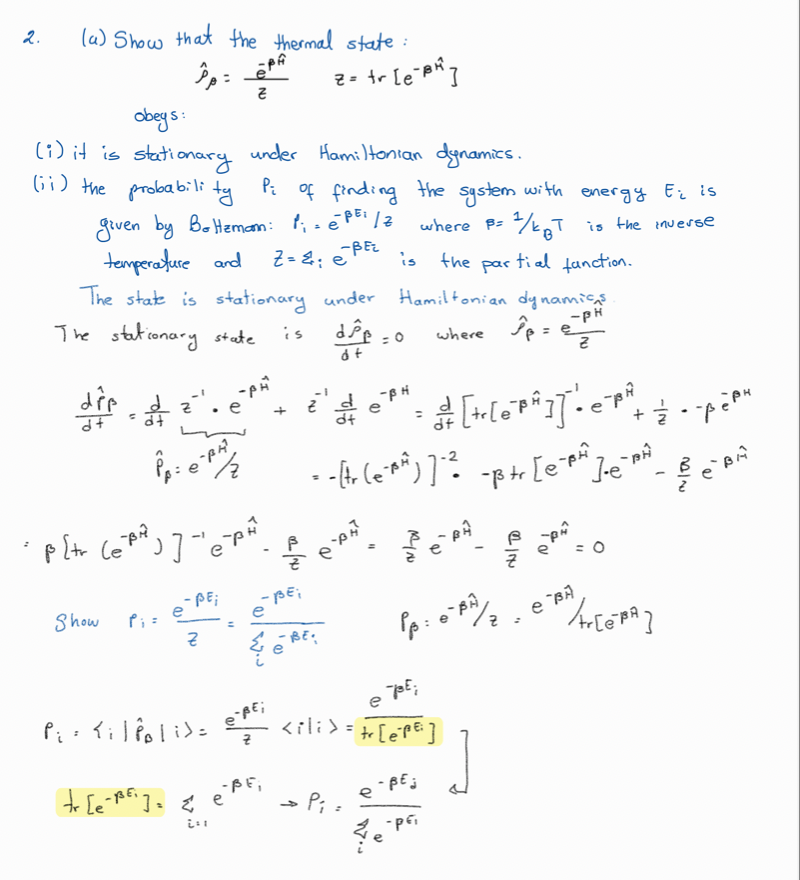

(b)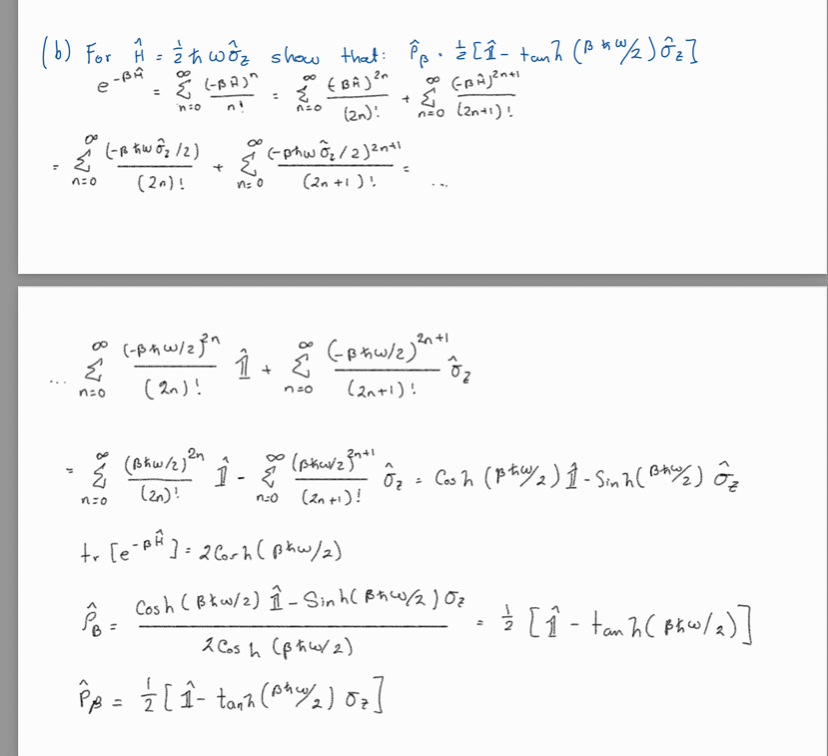

(c)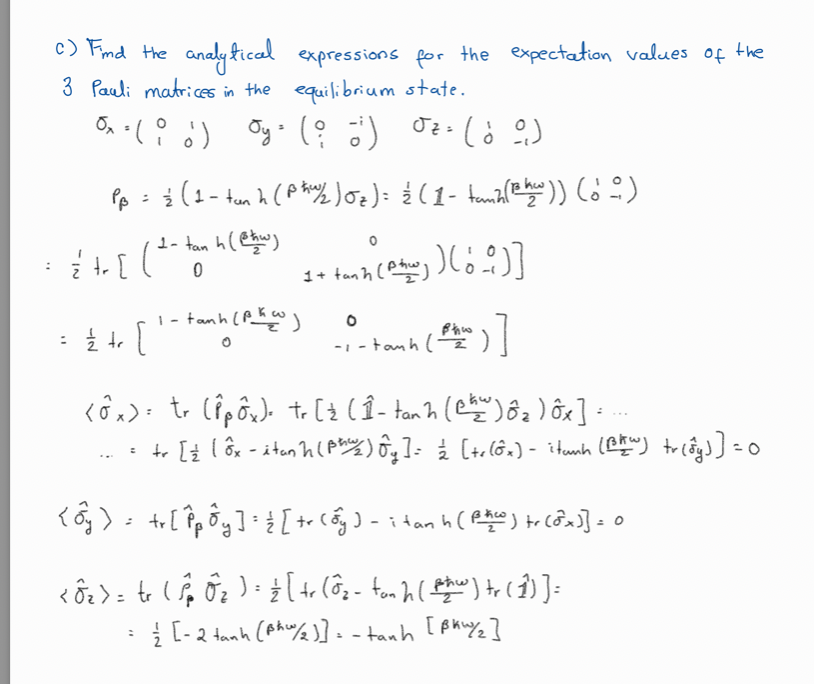

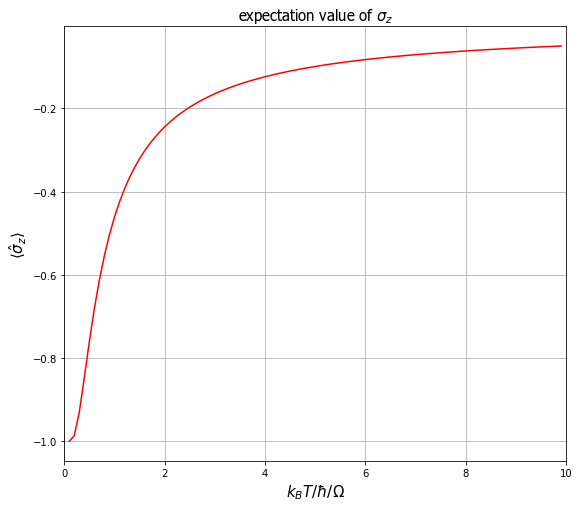

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.style as style
from scipy.linalg import expm
import json
from random import random

font={'family':'tahoma', 'color':'black', 'weight':'normal', 'size':'normal', 'size':15,}

def exp_value(x,y,ylabel,xlabel='$\omega$t',fig_size=(9,8),plot_grid=True,x_range=[0,10],colour='r'):
    plt.figure(figsize=fig_size)
    plt.plot(x,y,colour)
    plt.xlim(x_range)
    plt.grid(plot_grid)
    plt.xlabel(xlabel, fontdict=font)
    plt.ylabel('$\langle$'+ylabel+'$\\rangle$',fontdict=font)
    plt.ylabel('$\\langle \hat{\\sigma}_z\\rangle$')
    plt.title(f'expectation value of {ylabel}',fontdict=font)
    plt.show()

x=list(np.arange(0.1,10,0.1))
y=[-np.tanh(0.5*(i**-1))for i in x]

exp_value(x,y,ylabel='$\sigma_z$',xlabel='$k_B T/\hbar/\u03A9$')





## 3. 
The following function samples a "biased coin", which gives the result 0 (heads) with probability p and gives the result 1 (tails) with probability 1-p. Play around with it and try to understand how it works.

In [2]:
from random import random
def biased_coin(p):
    r = random()
    if r<p:
        return 0
    else:
        return 1

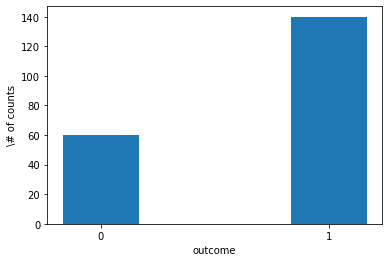

In [3]:
# Sample the biased coin 
n_samp = 200
p = 0.3
samples = []
for ii in range(n_samp):
    samples.append(biased_coin(p))

# Put the data on a histogram (using 4 bins to add a bit of white space in between)
plt.hist(samples,4,(0,1))
plt.xticks([0.125,0.875],[0,1])
plt.xlabel('outcome')
plt.ylabel('\# of counts')
plt.show()

(a) Plot a histogram of 200 realisations of the output of biased_coin() for p=0.3. (Hint: check out the [hist](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.hist.html) function).

Results:  [0 1 1 1 0 0 0 1 0 0 0 1 0 1 0 1 1 1 1 1 0 1 1 0 0 0 0 1 1 0 0 0 1 0 1 1 0
 1 1 0 0 1 1 0 1 1 1 1 0 1 0 0 1 0 0 1 0 1 1 0 1 0 1 0 0 0 1 0 0 0 1 1 1 1
 1 0 0 1 0 1 1 1 0 1 1 1 1 1 0 0 1 0 1 1 1 0 0 0 1 0 0 0 0 0 0 1 1 0 1 1 0
 1 1 1 0 1 0 0 1 1 0 1 0 1 1 0 1 0 0 1 0 1 1 0 1 1 0 1 0 1 1 0 1 0 0 1 0 0
 0 0 1 1 0 1 0 1 1 1 1 1 0 1 1 0 0 1 1 0 0 0 1 1 1 1 1 1 0 1 0 0 1 0 1 0 1
 1 0 1 1 1 1 1 0 1 1 1 1 0 0 1]


<IPython.core.display.Javascript object>


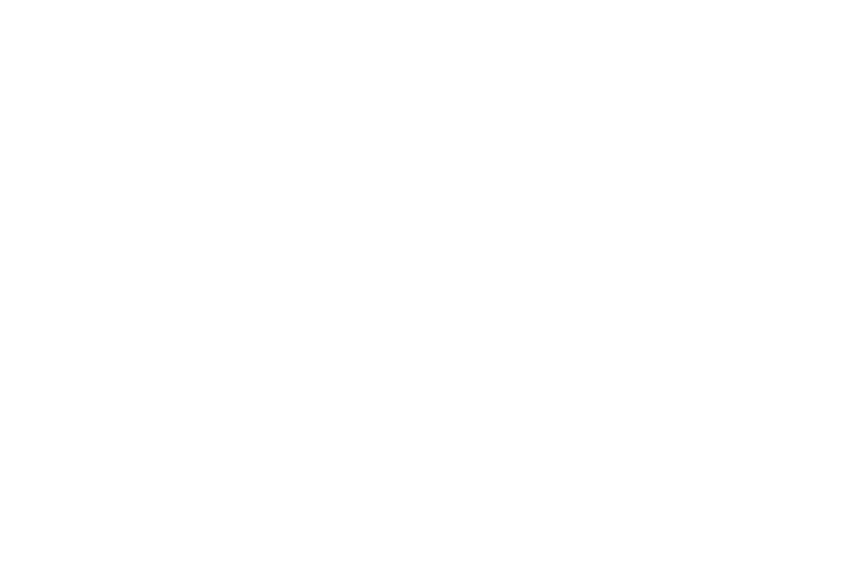

Text(0, 0.5, 'number of occurances')

In [4]:
import numpy as np
from scipy import stats
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook
from random import random

def biased_coin(p):
    r = random()
    if r<p:
        return 0
    else:
        return 1
N=200 #number of realisations
toss_result=np.zeros(N) #array to store the outcomes of the toss
#performing the 200 tosses with p = 0.3.
for i in range(N):
    toss_result[i]=biased_coin(0.3)
    

n_flips = 200 # Number of coin flips
data = stats.randint.rvs(0, 2, size=n_flips)
print("Results: ",data)

plt.hist(toss_result, color='g')
plt.title('Histogram of the biased coin with p=0.3 and N=200')
plt.xlabel('outcome')
plt.ylabel('number of occurances')


(b) Write an analogous function that samples a "three-sided coin", which yields the result 0 with probability $p_0$, 1 with probability $p_1$, and 2 with probability $1-p_0-p_1$. Plot a histogram of 200 samples of the output  for $p_0=0.2$ and $p_1 = 0.5$.

Text(0, 0.5, 'N')

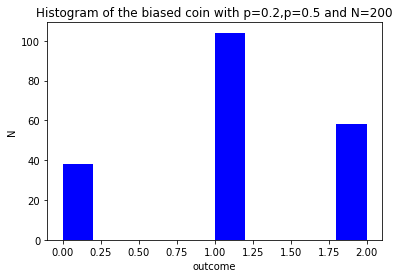

In [10]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

def biased_coin(p0,p1):
    r=random()
    if r<p0:
        return 0
    elif r<p0+p1:
        return 1
    else:
        return 2
N=200
toss_result=np.zeros(N)
for i in range(N):
    toss_result[i] = biased_coin(0.2,0.5)

    
plt.hist(toss_result, color='b')
plt.title("Histogram of the biased coin with p=0.2,p=0.5 and N=200")
plt.xlabel('outcome')
plt.ylabel('N')



(c) Generalise the function to an "$N$-sided coin", which yields the result $i \in \{0,1,2,\ldots,N-1\}$ with probability $p_i$. Provide a histogram demonstrating that the function works as expected.

<IPython.core.display.Javascript object>


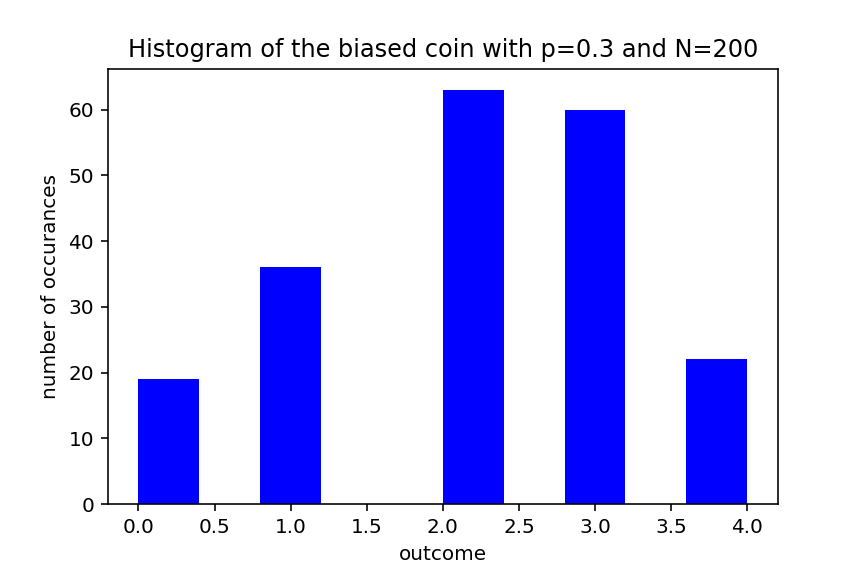

Text(0, 0.5, 'number of occurances')

In [9]:
import numpy as np
from scipy import stats
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook

from random import random
def biased_coinN(N,p):
    r = random()
    p_tot=0
    for i in range(N):
        p_tot += p[i]
        if r<p_tot:
            return i
#for 200 realisations in a N-sided coin:
R=200
N=5
#Building an array to store the outcomes of the toss
toss_resultN=np.zeros(R)
#with the following probabilities:
prob=[0.1, 0.2, 0.3, 0.3, 0.1]
#and performing a 200 biased coin tosses 
for i in range(R):
    toss_resultN[i]=biased_coinN(N,prob)


plt.hist(toss_resultN, color='b')
plt.title('Histogram of the biased coin with p=0.3 and N=200')
plt.xlabel('outcome')
plt.ylabel('number of occurances')

(d) Can you generalise this to sample from a continuous probability distribution? Write a function that outputs a random number $x$ in the interval $x\in [0,1]$ according to the probability density $$ p(x) = \frac{\pi}{2} \sin(\pi x).$$ Demonstrate your function with a histogram.

<IPython.core.display.Javascript object>


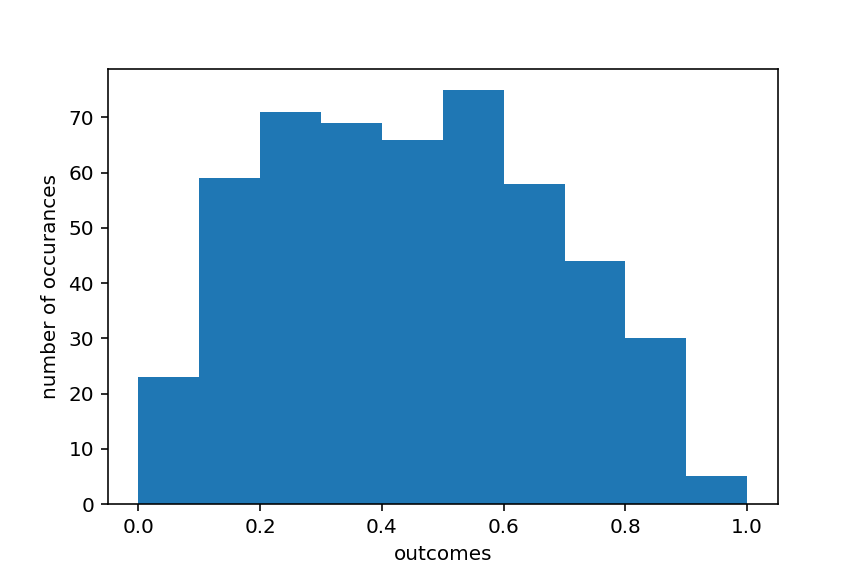

In [11]:
import numpy as np
from scipy import stats
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook
R=500

def distr(x):
    dx=x[1]-x[0]
    probs=[(np.pi/2)*np.sin(np.pi*i)*dx for i in x]
    return probs

def biased_coinN2(R,x):
    p = distr(x)
    cumprob = np.cumsum(p)
    results=[]
    for i in range(R):
        r = float(np.random.random())
        go,j = True, 0
        while go:
            j+=1
            go = r>=cumprob[j]
        index = j-1
        results.append(float(x[index-1]))
    return results 


x = np.linspace(0,1)

results = biased_coinN2(R,x)
plt.hist(results)
plt.xlabel('outcomes')
plt.ylabel('number of occurances')
plt.show()

## 4.
In this exercise we will compare the thermal state of a qubit
$$ \hat{\rho}_\beta = \frac{{\rm e}^{-\beta\hbar\omega\hat{\sigma}_z/2}}{Z},$$
to the pure state
$$|\psi_\beta\rangle = \frac{1}{\sqrt{Z}}\left({\rm e}^{-\beta\hbar\omega/4}|0\rangle + {\rm e}^{\beta\hbar\omega/4}|1\rangle\right), $$
where $Z = {\rm tr}({\rm e}^{-\beta\hbar\omega\hat{\sigma}_z/2})$.

(a) Write down general expressions for the density matrices corresponding to both of the above states.

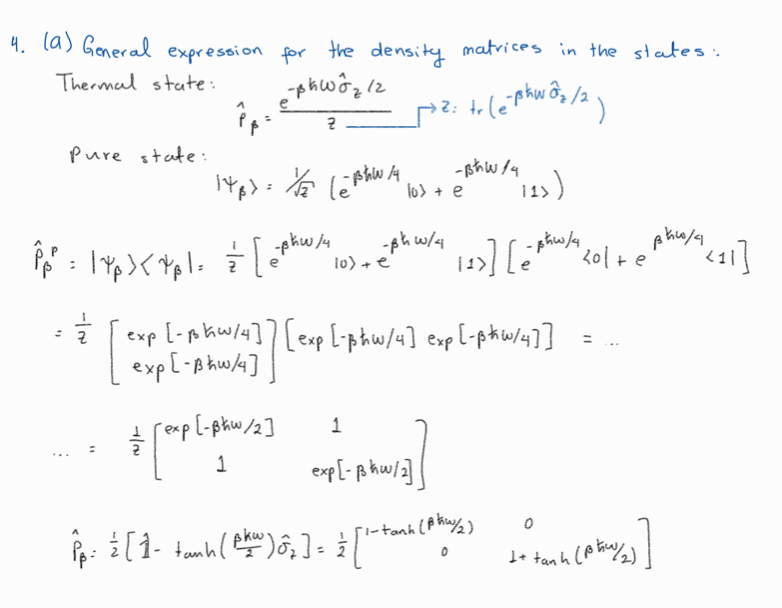

(b) Consider a projective measurement of the observable $\hat{\sigma}_z$. Give the probabilities of the two measurement outcomes for the thermal state $\hat{\rho}_\beta$. Give the analogous measurement outcome probabilities for the pure state $|\psi_\beta\rangle$. Write down the expectation value $\langle \hat{\sigma}_z\rangle$ for both states. Comment briefly on the results.

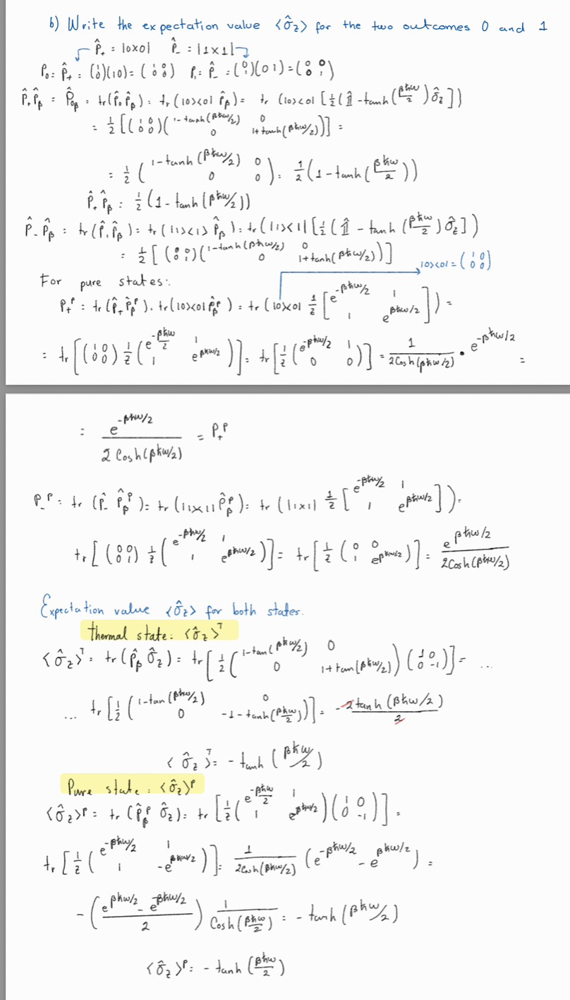

(c) Now consider a projective measurement of the observable $\hat{\sigma}_x$. Give the measurement outcome probabilities for the two different states $\hat{\rho}_\beta$ and $|\psi_\beta\rangle$. Write down the expectation value $\langle \hat{\sigma}_x\rangle$ for both states. Comment briefly on the results.

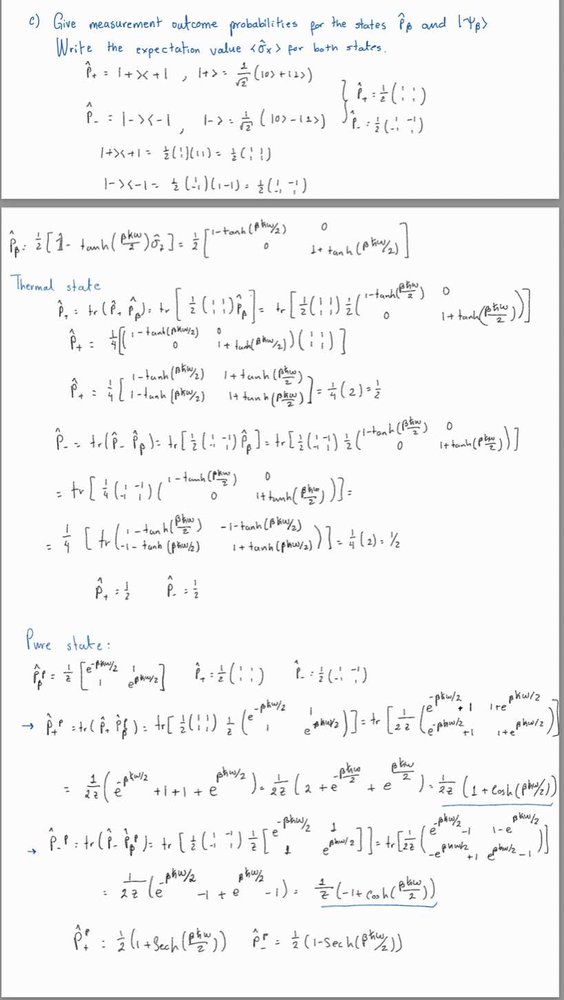

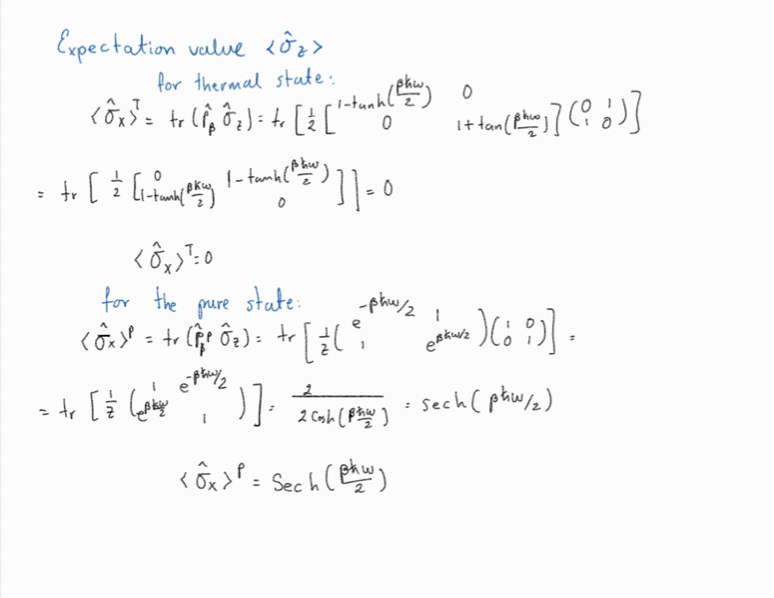

(d) Repeat the calculations for a projective measurement of $\hat{\sigma}_y$ and briefly comment on the result.

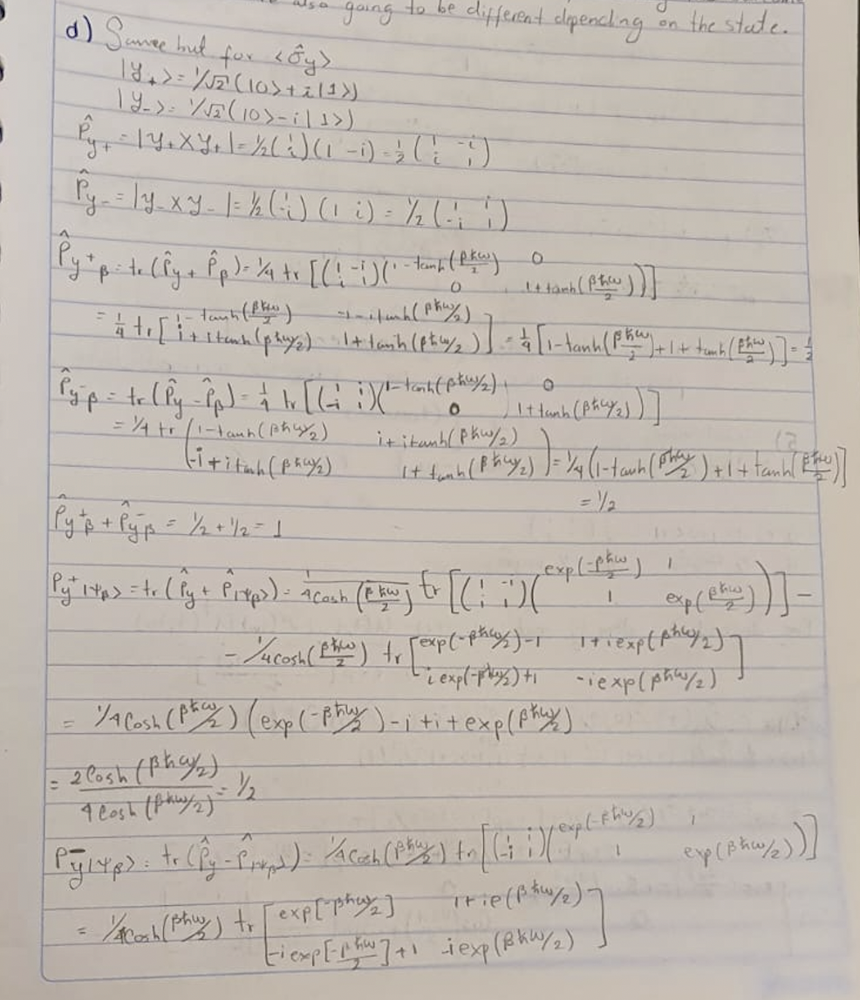

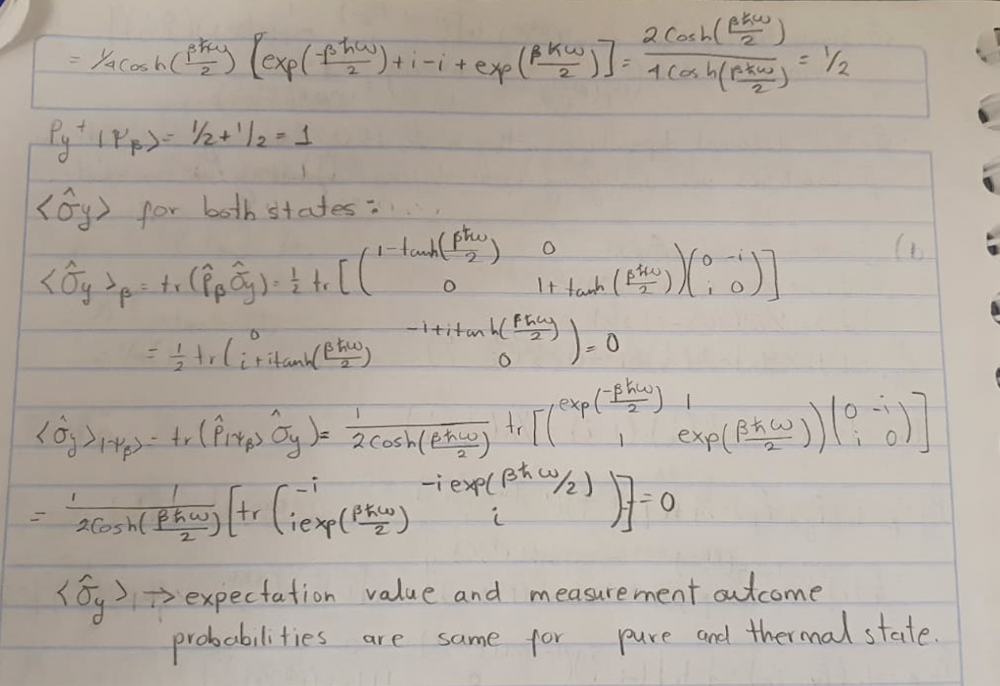

The expectation value of <$\hat\sigma_{y}$> for the thermal state is zero as the off-diagonal elements of $\hat\rho_{\beta}\$ is zero and the pure state of the off-diagonal elements is non-fluctatiing, so the expectation value is also 0.


## 5. 
Consider the following simple decoherence model for a qubit. The Hamiltonian is 
$$ \hat{H} = \frac{\hbar\omega}{2} \hat{\sigma}_z,$$
where $\omega$ is a random variable that takes the values $\omega \in \{+\omega_0,-\omega_0\}$ with equal probabilities $p_+ = p_- = \tfrac{1}{2}$.

(a) Write down an analytical expression for the time-dependent density matrix describing the ensemble, starting from the initial condition $\hat{\rho}(0) = |+\rangle\langle +|$.

(b) The purity $P$ is defined by $P={\rm tr} \hat{\rho}^2$. It is a real number that varies between $P=1$ for a pure state and $P = 1/2$ for a maximally mixed state of a qubit. (More generally, $P$ varies between $1$ and $1/d$ for a system with Hilbert-space dimension $d$.) Plot the purity of the qubit density matrix as a function of time in the interval $\omega_0 t = [0,10]$. Comment briefly on what happens at $t = \pi/2\omega_0 $, $t = \pi/\omega_0 $, and $t=2\pi/\omega_0$.

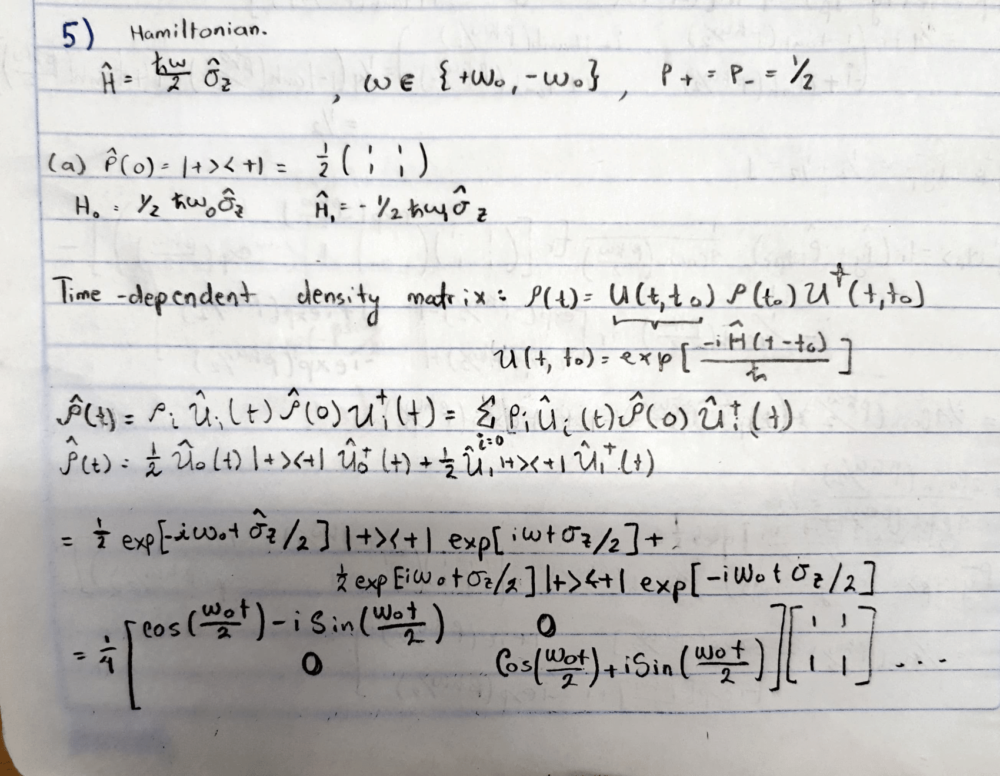

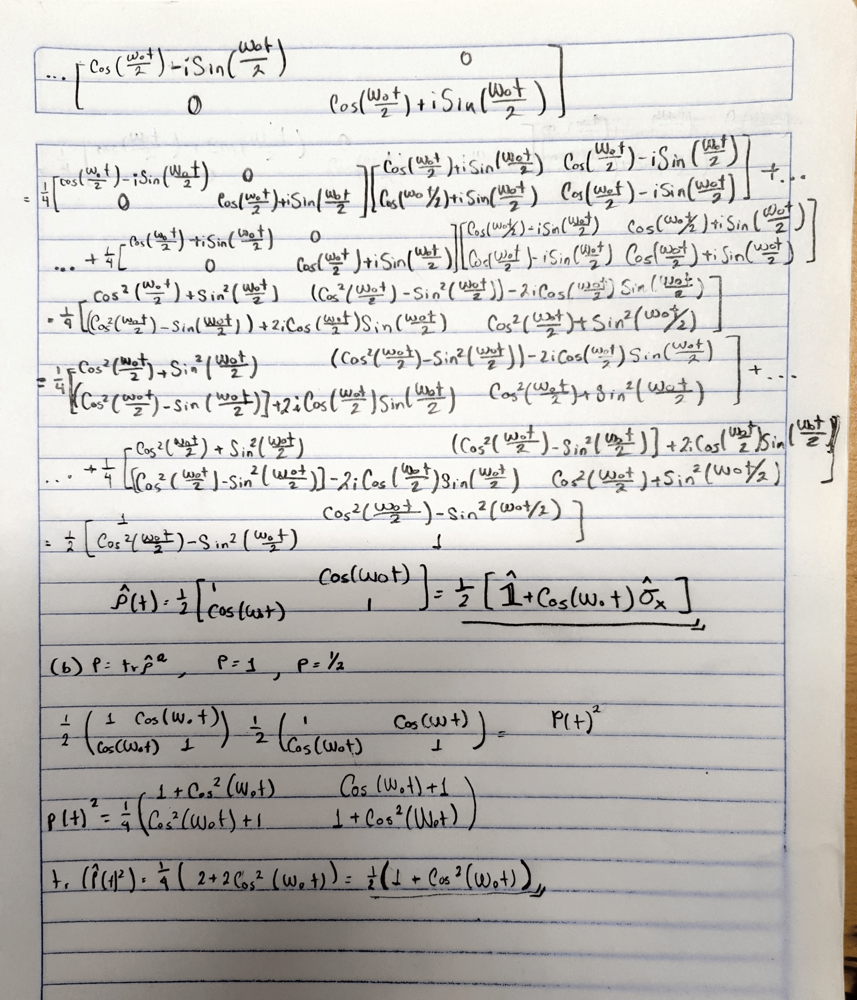

<IPython.core.display.Javascript object>


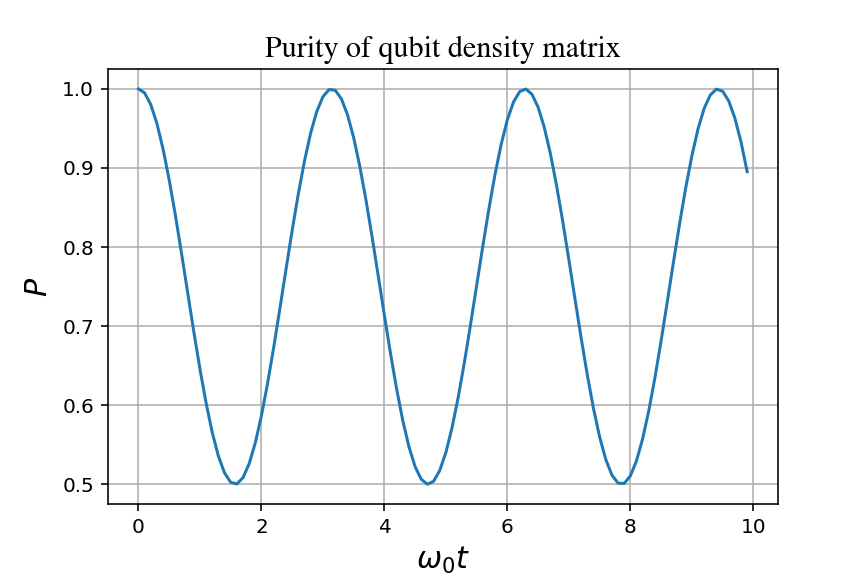

In [17]:
import numpy as np
from scipy import stats
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook

font={'family':'Times', 'color':'black', 'weight':'normal', 'size':'normal', 'size':15,}

omega= np.arange(0,10,0.1) #time interval [0,10]
rho = [1/2*(1+np.cos(t)**2) for t in omega]
plt.plot(omega,rho)
labels = ['$0$', r'$\pi/2$', r'$\pi$', r'$3\pi/2$', r'$2\pi$', r'$5\pi/2$', r'$3\pi$']
plt.xlabel('$\omega_0t$', fontdict = font), plt.ylabel('P = tr ($\\hat{\\rho}^2$) ', fontdict = font)
plt.ylabel('$P$')
plt.title('Purity of qubit density matrix',fontdict = font)
plt.grid()
plt.show()

Density matrix is: $\rho=1/2(1+cos^2(w_0 t))$.

The purity oscillates from 0 to 0.5pi and in every half rotation from 0 onwards (0, pi, 2pi, etc.) it's in pure state and every half rotation from 0.5pi onwards it's in a maximally mixed state. 

## 6. 
Now consider a qubit decoherence model, $\hat{H} = \hbar\omega\hat{\sigma}_z/2$, where the qubit transition frequency is a Gaussian random variable specified by the expectations
$$ \mathbb{E}[\omega] = \omega_0,\qquad \mathbb{E}[(\omega-\omega_0)^2] = g^2.$$

(a) Consider the evolution starting from the initial state $\hat{\rho}(0) = |+\rangle\langle +|$. Simulate $M=20$ random realisations of the qubit dynamics up to a time $\omega_0 t = 30$, with $g = 0.1\omega_0$. Plot the expectation value $\langle \hat{\sigma}_x\rangle$ as a function of time for each realisation (put them all on one plot). 

/var/folders/07/02v51ss15857xv4ddkzq17_c0000gn/T/ipykernel_8778/3917410561.py:41: ComplexWarning: Casting complex values to real discards the imaginary part
  expectationv_x[i,j] = np.array(np.trace(rho@sigma_x),dtype = float) #expectation value of sigma_x every iteration (time)


<IPython.core.display.Javascript object>


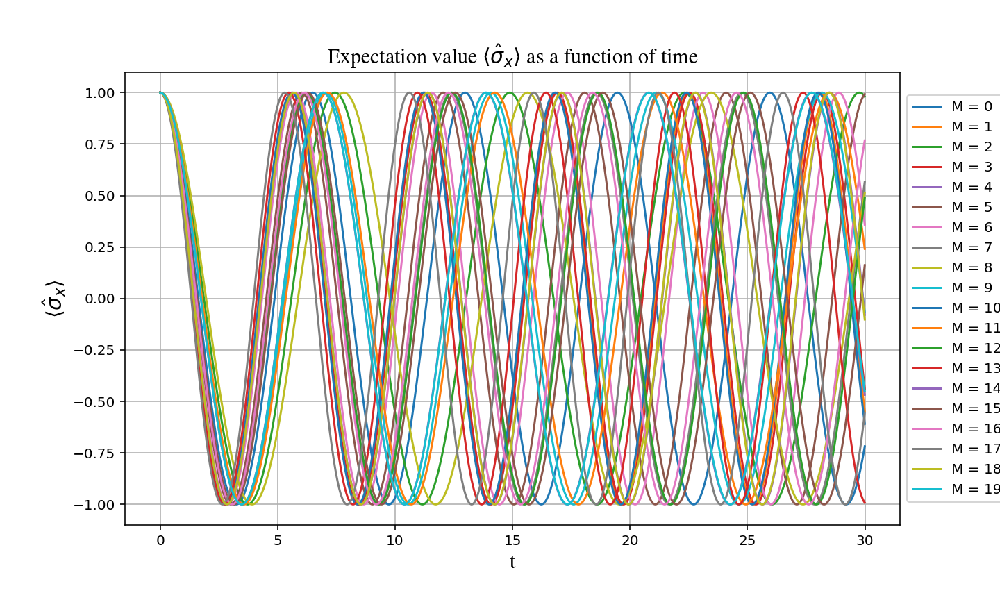

In [18]:
import numpy as np
from scipy import stats
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook
from scipy.linalg import expm

initial_state = (1/np.sqrt(2))*(np.array([[1],[1]])) #initial state p(0)

rho_0 = np.outer(initial_state,initial_state)

# 𝔼[𝜔] and 𝔼[(𝜔−𝜔0)]
omega_0 = 1
g = 0.1*omega_0
mean, stdev = omega_0, g
W = np.random.normal(mean, stdev,100)

delta_t = 0.01
t = np.arange(0,30,delta_t)
realisations = 20 # Realisations

# Pauli Matrices
sigma_z = np.array([[1,0],[0,-1]])
sigma_x=np.array([[0,1],[1,0]])

#creation of an array to store the 20 values.

expectationv_x= np.zeros((realisations,len(t),1))
omega = np.zeros((realisations,1))

# Calculating ⟨sigma_x⟩ for each realisation. 
for i in range(realisations):
    omega[i] = np.random.choice(W,1)
    H = (1/2)*omega[i]*sigma_z  # Hamiltonian 
    U = expm(-1j*H*delta_t) # Unitary operator
    U_daga = U.conj().T
    rho = rho_0
    
#Loop for evaluation through time.
    for j in range(len(t)):
        expectationv_x[i,j] = np.array(np.trace(rho@sigma_x),dtype = float) #expectation value of sigma_x every iteration (time)
        rho = U@(rho)@U_daga

# Plot all 20 realisations
plt.figure(figsize = (10,6))
for r in range(realisations):
    plt.plot(t,expectationv_x[r,:], label = 'M = {}'.format(r))
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.title('Expectation value $\\langle \\hat{\\sigma}_{x}\\rangle$ as a function of time', fontdict = font)
plt.ylabel('$\\langle \\hat{\\sigma}_{x}\\rangle$',fontdict = font), plt.xlabel('t',fontdict = font)
plt.grid()

(b) Plot the sample average of $\langle \hat{\sigma}_x\rangle$ from your simulated trajectories. The sample average is defined as
    $$\overline{\langle \hat{\sigma}_x\rangle}_{\rm samp} = \frac{1}{M} \sum_{m=1}^M \langle \hat{\sigma}_x\rangle_m,$$
    where $\langle \hat{\sigma}_x\rangle_m$ is the result for the $m^{\rm th}$ trajectory. How does this compare to what you expect for a very large number of trajectories $M\to\infty$?

<IPython.core.display.Javascript object>


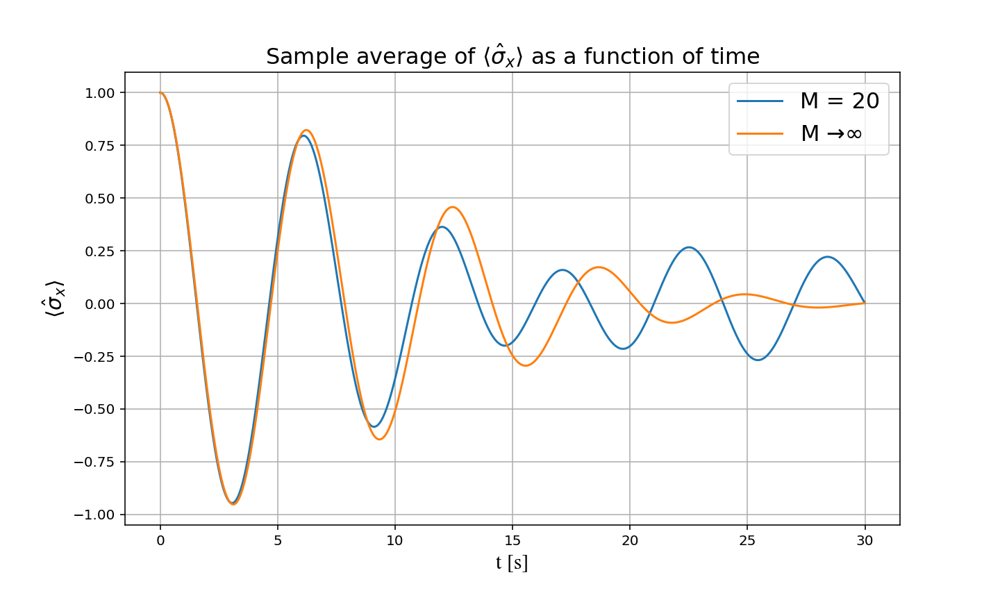

In [19]:
# Sample average of sigma_X
average_x = 0
for l in range(realisations):
    average_x  = (average_x  + expectationv_x[l,:]/realisations)
    
# Expectation value as M goes to infinity    
expectation_inf = (np.exp(-((g**2)*(t**2))/2))*np.cos(omega_0*t)

plt.figure(figsize = (10,6))
plt.plot(t, average_x, label = 'M = 20')
plt.plot(t,expectation_inf, label = 'M $\\to\infty$')
plt.title('Sample average of $\\langle \\hat{\\sigma}_{x}\\rangle$ as a function of time',fontsize = 16)
plt.ylabel('$\\langle \\hat{\\sigma}_{x}\\rangle$',fontdict = font), plt.xlabel('t [s]',fontdict = font)
plt.grid()
plt.legend(fontsize = 16)


## 7. 
The amplitude damping channel is a CPTP map for a qubit that describes the loss of energy, e.g. through spontaneous emission. The map is specified by the Kraus operators
$$ \hat{K}_0 = \sqrt{1-r} \hat{\sigma}_+\hat{\sigma}_- + \hat{\sigma}_-\hat{\sigma}_+,\qquad \hat{K}_1 = \sqrt{r}\hat{\sigma}_-,$$
where $\hat{\sigma}_\pm = \frac{1}{2}(\hat{\sigma}_x\pm{\rm i}\hat{\sigma}_y)$ are the usual qubit raising and lowering operators. 

(a) Verify that the Kraus operators above constitute a CPTP map.

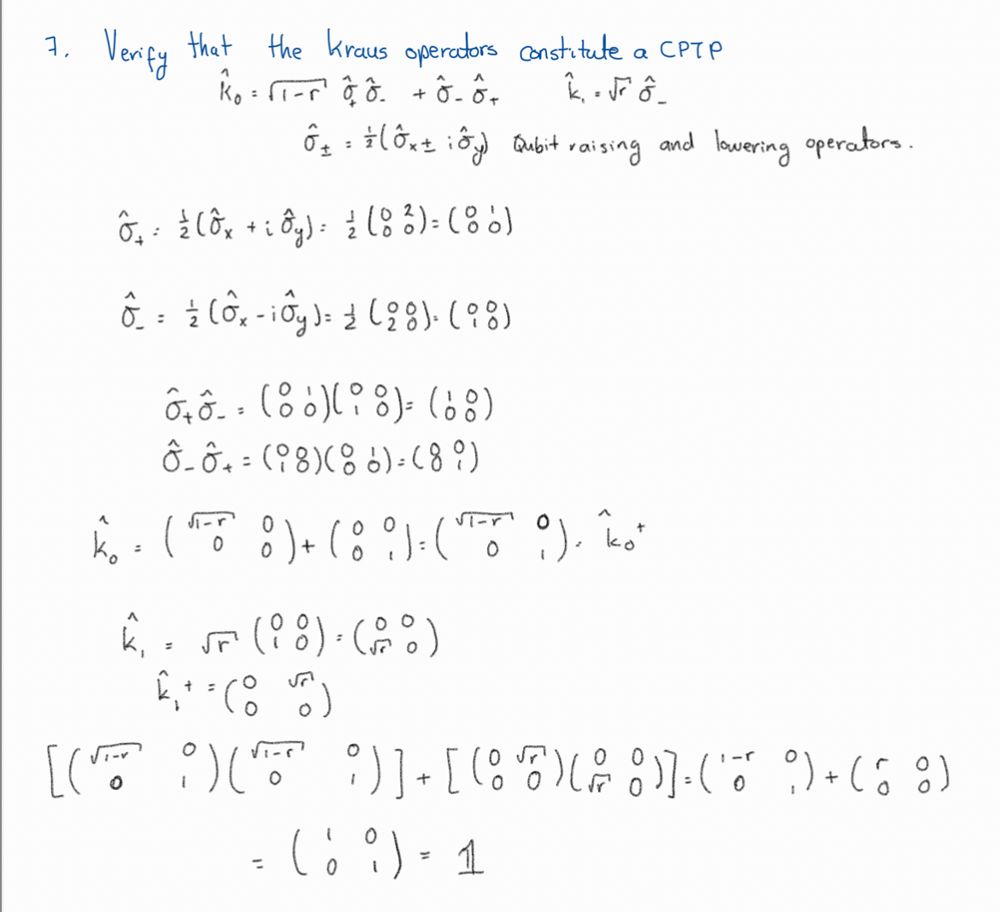

(b) Starting from the superposition state $\hat{\rho} = |+\rangle\langle +|$, with $|+\rangle = \tfrac{1}{\sqrt{2}}(|0\rangle + |1\rangle)$, find the density matrix $\mathcal{E}(\hat{\rho})$ (e.g. numerically) and plot the expectation values of the three Pauli operators $\hat{\sigma}_{x,y,z}$ as a function of $r$.

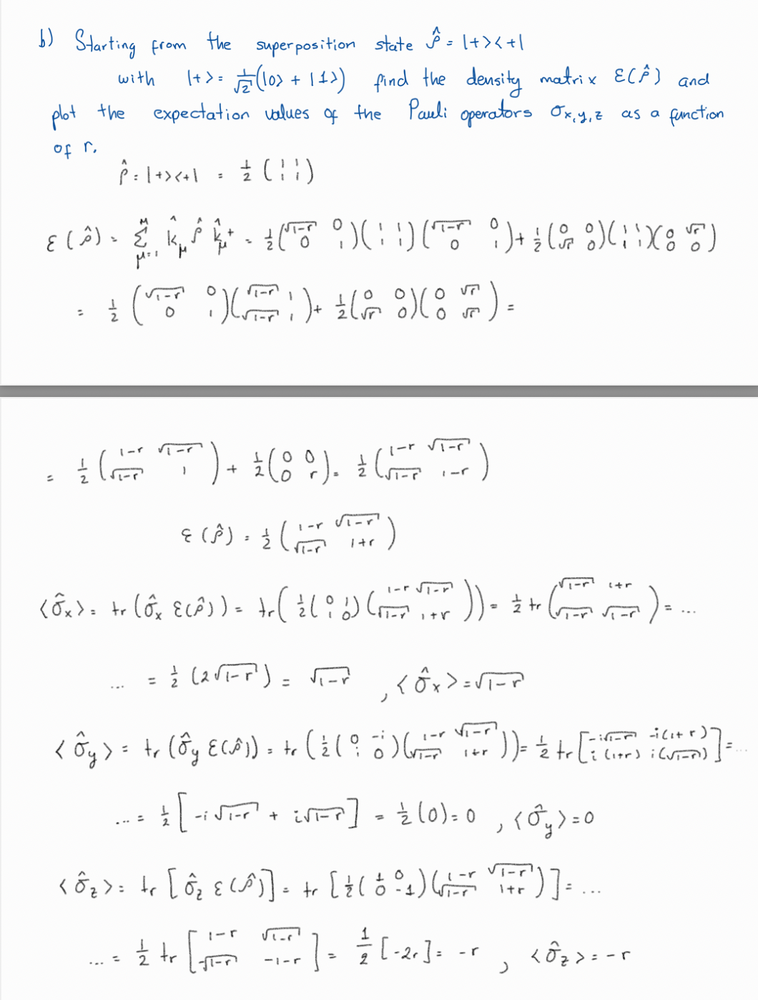

<IPython.core.display.Javascript object>


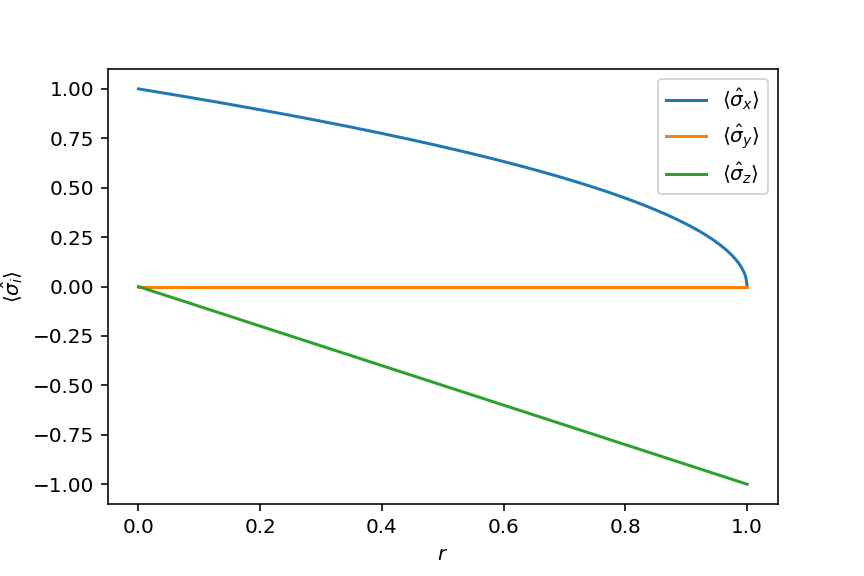

In [20]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook

#pauli matrices
x=np.array([[0,1],[1,0]])
y=np.array([[0,-1j],[1j,0]])
z=np.array([[1,0],[0,-1]])
#raising operators
m=0.5*(x-1j*y)
p=0.5*(x+1j*y)

def kraus_map(r,rho):
    #kraus operators in therms of m and p
    kraus_0=(1-r)**0.5*p@m+m@p
    kraus_1=r**0.5*m
    return kraus_0@rho@kraus_0.conj().T+kraus_1@rho@kraus_1.conj().T #density matrix

def kraus_expectation_values(r,rho_in): #expectation values calculation as a function of r
    rho=kraus_map(r,rho_in)
    x_1=np.trace(rho@x)
    y_1=np.trace(rho@y)
    z_1=np.trace(rho@z)
    return x_1,y_1,z_1

n_line=500
r_values=np.linspace(0,1,n_line)
rho_0=0.5*np.array([[1,1],[1,1]])
x_values,y_values,z_values=[],[],[]

for j,r in enumerate(r_values):
    x_1,y_1,z_1=kraus_expectation_values(r,rho_0)
    x_values.append(np.real(x_1))
    y_values.append(np.real(y_1))
    z_values.append(np.real(z_1))
    
plt.plot(r_values,x_values,label='$\\langle \hat{\sigma}_x\\rangle$')
plt.plot(r_values,y_values,label='$\\langle \hat{\sigma}_y\\rangle$')
plt.plot(r_values,z_values,label='$\\langle \hat{\sigma}_z\\rangle$')
plt.xlabel('$r$')
plt.ylabel(r'$\langle\hat{\sigma_i}\rangle$')
plt.legend()
txt=r'plot of $\langle\hat{\sigma_i}\rangle$ vs. r'


(c) Now let us interpret the above Kraus operators as representing a generalised measurement with two outcomes. Write down analytical expressions for the probabilities of these two outcomes and the corresponding post-measurement states, assuming an arbitrary initial density matrix $\hat{\rho}$. Plot a histogram of the results that might be obtained from 200 such measurements on the state $\hat{\rho} = |+\rangle\langle +|$, assuming that $r=0.5$.

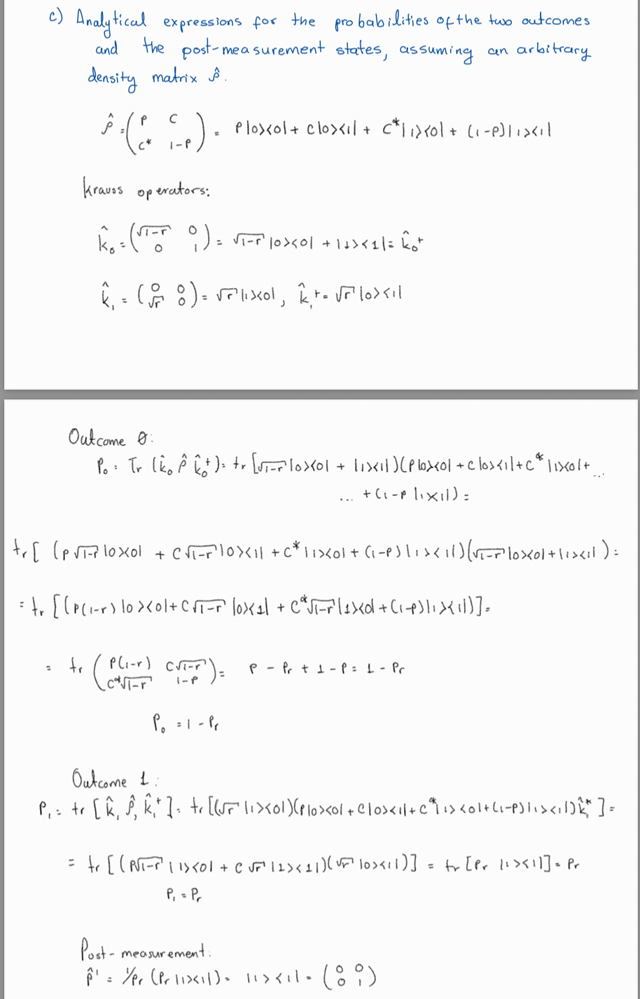

<IPython.core.display.Javascript object>


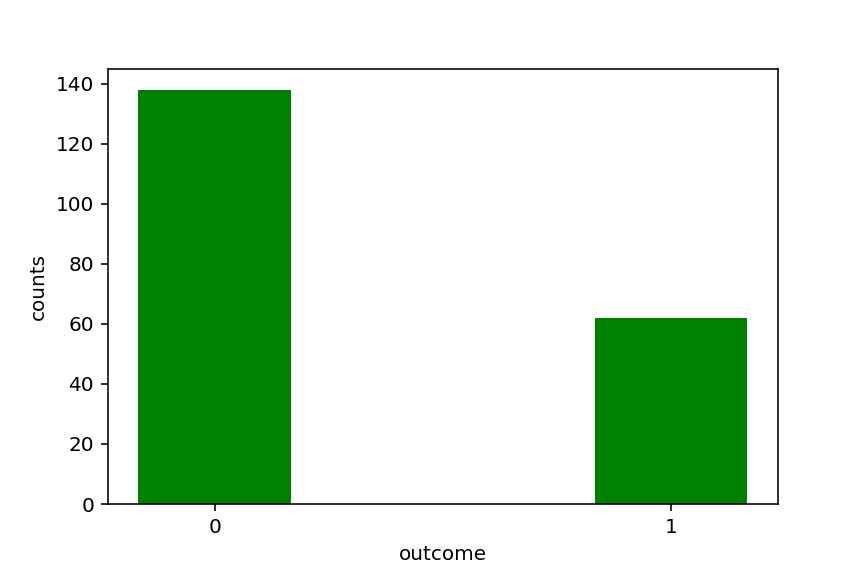

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
%matplotlib notebook

from random import random
def biased_coin(p):
    r = random()
    if r<p:
        return 0
    else:
        return 1

r=0.5
kraus_0=(1-r)**0.5*p@m+m@p
kraus_1=r**0.5*m
rho=0.5*np.array([[1,1],[1,1]])
p_0=np.trace(kraus_0@rho@kraus_0.T.conj())
p_1=np.trace(kraus_1@rho@kraus_1.T.conj())

realisations=[biased_coin(p_0) for i in range(200)]
plt.hist(realisations, 4, (0,1), color='g')
plt.xticks([0.125,0.875],[0,1])
plt.xlabel('outcome')
plt.ylabel('counts')
txt='histogram of outcomes for 200 realisations'


(d) Now consider the generalised measurement defined by the Kraus operators
$$ \hat{K}_0 = \sqrt{1-r}\hat{\sigma}_+\hat{\sigma}_-, \qquad \hat{K}_1 = \hat{\sigma}_-\hat{\sigma}_+, \qquad \hat{K}_2 = \sqrt{r}\hat{\sigma}_-.$$
As in part (c), give general expressions for the probabilities of each outcome and the corresponding post-measurement state. Simulate the outcome (i.e. plot a histogram) of 200 measurements on the state $\hat{\rho} = |+\rangle\langle +|$. How does this measurement differ from the one in part (c)?

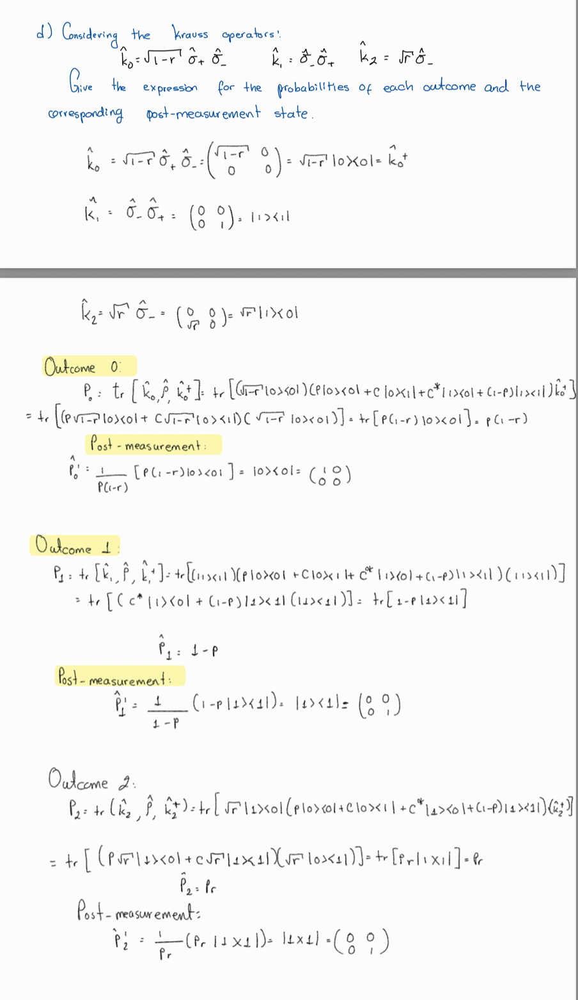

<IPython.core.display.Javascript object>


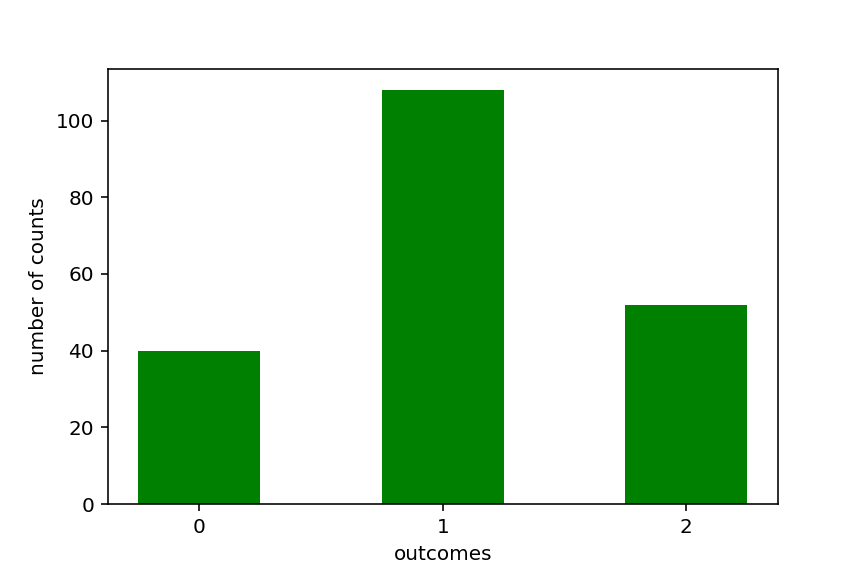

Text(1, -30, 'histogram of outcomes for 200 realisations')

In [22]:
import numpy as np
from random import random
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook

def biased_coin(p0,p1):
    r = random()
    if r<p0:
        return 0
    elif r<p1+p0:
        return 1
    else:
        return 2
    
r=0.5
kraus_0=(1-r)**0.5*p@m
kraus_1=m@p
kraus_2=r**0.5*m

    
rho=0.5*np.array([[1,1],[1,1]])
p0=np.trace(kraus_0@rho@kraus_0.T.conj())
p1=np.trace(kraus_1@rho@kraus_1.T.conj())

realizations=[biased_coin(p0,p1) for i in range(200)]
plt.hist(realizations,5,(0,2),color='g')
plt.xticks([0.2,1,1.8],[0,1,2])
plt.xlabel('outcomes')
plt.ylabel('number of counts')
txt='histogram of outcomes for 200 realisations'
plt.text(1,-30,txt,ha='center',wrap=True,fontsize=15)

## 8. 
(a) The partial trace over one qubit of a two-qubit system is defined by

$$ \hat{\rho}_A = {\rm tr}_B ( \hat{\rho}) = \sum_{j=0}^1 \langle b_j| \hat{\rho}|b_j\rangle = \sum_{j=0}^1 (\hat{\mathbb{1}}_A\otimes\langle b_j|) \hat{\rho}(\hat{\mathbb{1}}_A\otimes| b_j\rangle), $$

where $\{|b_j\rangle\}$ is any orthonormal basis in the Hilbert space of qubit $B$. Assume that $|b_{0}\rangle = |0\rangle$ and $|b_1\rangle = |1\rangle$ are the computational basis states. Construct the Kraus operators describing the above CPTP map. Verify numerically that the Kraus operators obey the completeness relation required for a CPTP map.

In [23]:
import numpy as np

from random import random
from scipy.linalg import expm

zero=np.array([1,0])
one=np.array([0,1])
kraus_0=np.kron(np.eye(2),zero)
kraus_1=np.kron(np.eye(2), one)
kraus_0.conj().T@kraus_0 + kraus_1.conj().T@kraus_1

array([[1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [0., 0., 0., 1.]])

(b) Now consider again the two-qubit problem described by the Hamiltonian

$$ \hat{H}  = -\frac{\hbar\omega_A}{2} \hat{\sigma}_z\otimes \hat{\mathbb{1}} -  \frac{\hbar\omega_B}{2} \hat{\mathbb{1}}\otimes \hat{\sigma}_z + \frac{\hbar J}{4} \left ( \hat{\sigma}_x \otimes \hat{\sigma}_x + \hat{\sigma}_y \otimes \hat{\sigma}_y \right  ) + \frac{\hbar V}{2}  \hat{\sigma}_z\otimes \hat{\sigma}_z,$$

which we saw in question 8 of Worksheet 1. Simulate the dynamics starting from the pure state $|\psi(0)\rangle = |10\rangle$. Use the parameters $\omega_A = \omega_B$ and $J=V = 0.5\omega_A$, and simulate up to a time $Jt = 20$. (You can either re-use your solution from Worksheet 1, or adapt the code from the solution provided.) Compute the reduced density matrix of qubit $A$ and plot its purity, $P = {\rm tr}(\hat{\rho}_A^2)$, as a function of time.

In [33]:
import numpy as np
from random import random
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook

sigma_x = np.array([[0,1],[1,0]])
sigma_y = np.array([[0,-1j],[1j,0]])
sigma_z = np.array([[1,0],[0,-1]])
iden = np.eye(2)

def qubit_b(rho):
    zero=np.array([1,0])
    one=np.array([0,1])
    kraus_0=np.kron(np.eye(2),zero)
    kraus_1=np.kron(np.eye(2), one)
    return kraus_0@rho@kraus_0.T + kraus_1@rho@kraus_1.T

def evolution(Hamiltonian, psi_i, tot_time, t):
    U_dt = expm(-1j*H*t)
    t_axis=np.arange(0,tot_time,t)
    psi=psi_i
    purity_evolution=[]
        
    for tt in t_axis:
        psi=U_dt@psi
        rho=np.outer(psi.conj(),psi)
        rho_1=traces(rho)
        p=np.trace(rho_1@rho_1).real
        purity_evolution.append(p)
    return t_axis,purity_evolution

def hamiltonian_2 (𝜔_A,𝜔_B,J,V):
    H = -(𝜔_A/2)*np.kron(sigma_z,iden) - (𝜔_B/2)*np.kron(iden,sigma_z) + (J/4)*(np.kron(sigma_x,sigma_x) + \
np.kron(sigma_y,sigma_y)) + (V/2)*np.kron(sigma_z,sigma_z)
    return H
𝜔_A,𝜔_B,J,V =2, 2, 1, 1
tot_time=20
t=0.05
psi_i = np.array([0,0,1,0])
hamiltonian = Hamiltonian_on_2_qubits (𝜔_A,𝜔_B,J,V)

t_axis, purity_evolution = purity(Hamiltonian, psi_i, tot_time, t)

plt.plot(t_axis, purity_evolution)
plt.xlabel('$time$')
plt.ylabel('$purity evolution$')
plt.show()

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 4 is different from 2)

(c) Repeat the purity calculation of part (b) but with the parameters $\omega_A = 2\omega_B$ and $J=V=0.5\omega_A$. Comment on the differences between the results of (b) and (c).

In [39]:
import numpy as np
from random import random
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib notebook

𝜔_A,𝜔_B,J,V = 2,1,1,1
hamiltonian=Hamiltonian_on_2_qubits (𝜔_A,𝜔_B,J,V)

t_axis,purity_evolution = evolution(Hamiltonian, psi_i, tot_time, t)
plt.plot(t_axis, purity_evolution)
plt.xlabel('$time$')
plt.ylabel('$purity evolution$')
plt.show()

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 4 is different from 2)